# lib

In [ ]:
# --- CÀI ĐẶT THƯ VIỆN HỆ THỐNG VÀ MÔI TRƯỜNG ---
!apt-get update > /dev/null 2>&1
!apt-get install -y xvfb python-opengl > /dev/null 2>&1

# Cài đặt Fake Display
!pip install pyvirtualdisplay > /dev/null 2>&1

# Cài đặt Box2D cho môi trường CarRacing
!pip install swig > /dev/null 2>&1
!pip install gymnasium[box2d] > /dev/null 2>&1

from pyvirtualdisplay import Display
# Khởi tạo một màn hình ảo ẩn (visible=0) với độ phân giải tùy chọn
display = Display(visible=0, size=(1400, 900))
display.start()

import os
# Đảm bảo các thư viện đồ họa biết phải trỏ vào màn hình ảo này
os.environ["DISPLAY"] = f":{display.display}"

print("Đã khởi tạo Fake Display và môi trường thành công!")

# --- KẾT NỐI GOOGLE DRIVE ---
from google.colab import drive
drive.mount('/content/drive')

import os
os.makedirs('/content/drive/MyDrive/WorldModels/data', exist_ok=True)

Đã khởi tạo Fake Display và môi trường thành công!
Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# ==========================================
# 1. SETUP MÔI TRƯỜNG VÀ FAKE DISPLAY
# ==========================================
!apt-get update > /dev/null 2>&1
!apt-get install -y xvfb python-opengl > /dev/null 2>&1
!pip install pyvirtualdisplay swig "gymnasium[box2d]" > /dev/null 2>&1

from pyvirtualdisplay import Display
import os

display = Display(visible=0, size=(1400, 900))
display.start()
os.environ["DISPLAY"] = f":{display.display}"
print("Đã khởi tạo Fake Display và môi trường thành công!")

Đã khởi tạo Fake Display và môi trường thành công!


# gộp dữ liệu version 10k

In [ ]:
!rm -rf /content/temp_batch
!rm -f /content/car_racing_10k.h5
print("Đã dọn dẹp xong! Sẵn sàng cho chiến dịch cuốn chiếu từng phần.")

Đã dọn dẹp xong! Sẵn sàng cho chiến dịch cuốn chiếu từng phần.


In [ ]:
import os
import h5py
import shutil
from concurrent.futures import ThreadPoolExecutor
from tqdm import tqdm
from google.colab import drive

# 1. MOUNT DRIVE
drive.mount('/content/drive')

BASE_DIR = '/content/drive/MyDrive/WorldModels/data_team'
SUB_FOLDERS = [
    'temp_episodes_acc_1', 'temp_episodes_acc_2',
    'temp_episodes_acc_3', 'temp_episodes_acc_4', 'temp_episodes_acc_5'
]

LOCAL_TEMP_DIR = '/content/temp_batch'
LOCAL_SSD_FILE = '/content/car_racing_10k.h5'
NUM_MAX_STEPS = 1000

def batch_process_merge_with_compression():
    print("🔍 Đang đếm tổng số lượng file...")
    folder_files_map = {}
    total_episodes = 0

    for folder_name in SUB_FOLDERS:
        folder_path = os.path.join(BASE_DIR, folder_name)
        if os.path.exists(folder_path):
            files = [f.path for f in os.scandir(folder_path) if f.name.endswith('.h5') or f.name.endswith('.hdf5')]
            files.sort()
            folder_files_map[folder_name] = files
            total_episodes += len(files)

    if total_episodes == 0:
        return print("❌ Không có file nào!")

    print(f"✅ Tổng cộng: {total_episodes} files.\n")

    print(f"🔨 Đang đúc file tổng CÓ NÉN GZIP trên SSD...")
    with h5py.File(LOCAL_SSD_FILE, 'w') as merged_h5f:
        # THÊM COMPRESSION VÀO ĐÂY ĐỂ CỨU DUNG LƯỢNG
        merged_h5f.create_dataset('actions', shape=(total_episodes, NUM_MAX_STEPS, 3), dtype='float32', chunks=(1, NUM_MAX_STEPS, 3), compression='gzip', compression_opts=4)
        merged_h5f.create_dataset('dones', shape=(total_episodes, NUM_MAX_STEPS), dtype='bool', chunks=(1, NUM_MAX_STEPS), compression='gzip', compression_opts=4)
        merged_h5f.create_dataset('images', shape=(total_episodes, NUM_MAX_STEPS, 96, 96, 3), dtype='uint8', chunks=(1, NUM_MAX_STEPS, 96, 96, 3), compression='gzip', compression_opts=4)
        merged_h5f.create_dataset('rewards', shape=(total_episodes, NUM_MAX_STEPS), dtype='float32', chunks=(1, NUM_MAX_STEPS), compression='gzip', compression_opts=4)

        global_idx = 0

        for folder_name, drive_files in folder_files_map.items():
            if not drive_files:
                continue

            print("="*60)
            print(f"🚀 ĐANG XỬ LÝ: {folder_name} ({len(drive_files)} files)")

            os.makedirs(LOCAL_TEMP_DIR, exist_ok=True)

            def copy_file(src_path):
                dst_path = os.path.join(LOCAL_TEMP_DIR, os.path.basename(src_path))
                shutil.copy2(src_path, dst_path)
                return dst_path

            with ThreadPoolExecutor(max_workers=32) as executor:
                local_files = list(tqdm(executor.map(copy_file, drive_files), total=len(drive_files), desc=f"📥 Tải {folder_name}", unit="file"))

            local_files.sort()

            for episode_file in tqdm(local_files, desc=f"⚙️ Gộp {folder_name}", unit="file"):
                try:
                    with h5py.File(episode_file, 'r') as ep_h5f:
                        ep_len = ep_h5f['actions'].shape[0]
                        valid_len = min(ep_len, NUM_MAX_STEPS)

                        merged_h5f['actions'][global_idx, :valid_len, :] = ep_h5f['actions'][:valid_len]
                        merged_h5f['dones'][global_idx, :valid_len] = ep_h5f['dones'][:valid_len]
                        merged_h5f['images'][global_idx, :valid_len, :, :, :] = ep_h5f['images'][:valid_len]
                        merged_h5f['rewards'][global_idx, :valid_len] = ep_h5f['rewards'][:valid_len]

                    global_idx += 1
                except Exception as e:
                    print(f"\n⚠️ Lỗi file: {episode_file} | Lỗi: {e}")
                    global_idx += 1

            shutil.rmtree(LOCAL_TEMP_DIR)
            print(f"🗑️ Đã xóa sạch {folder_name} khỏi SSD để nhường chỗ!\n")

    print("="*60)
    print(f"🎉 ĐÃ HOÀN TẤT TOÀN BỘ! File đã nén siêu nhỏ nằm tại: {LOCAL_SSD_FILE}")

# Kích hoạt hệ thống nén
batch_process_merge_with_compression()

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
🔍 Đang đếm tổng số lượng file...
✅ Tổng cộng: 10001 files.

🔨 Đang đúc file tổng CÓ NÉN GZIP trên SSD...
🚀 ĐANG XỬ LÝ: temp_episodes_acc_1 (2000 files)


⚙️ Gộp temp_episodes_acc_1: 100%|██████████| 2000/2000 [12:45<00:00,  2.61file/s]


🗑️ Đã xóa sạch temp_episodes_acc_1 khỏi SSD để nhường chỗ!

🚀 ĐANG XỬ LÝ: temp_episodes_acc_2 (2078 files)


⚙️ Gộp temp_episodes_acc_2: 100%|██████████| 2078/2078 [12:49<00:00,  2.70file/s]


🗑️ Đã xóa sạch temp_episodes_acc_2 khỏi SSD để nhường chỗ!

🚀 ĐANG XỬ LÝ: temp_episodes_acc_3 (2000 files)


⚙️ Gộp temp_episodes_acc_3: 100%|██████████| 2000/2000 [12:45<00:00,  2.61file/s]


🗑️ Đã xóa sạch temp_episodes_acc_3 khỏi SSD để nhường chỗ!

🚀 ĐANG XỬ LÝ: temp_episodes_acc_4 (2000 files)


⚙️ Gộp temp_episodes_acc_4: 100%|██████████| 2000/2000 [12:28<00:00,  2.67file/s]


🗑️ Đã xóa sạch temp_episodes_acc_4 khỏi SSD để nhường chỗ!

🚀 ĐANG XỬ LÝ: temp_episodes_acc_5 (1923 files)


⚙️ Gộp temp_episodes_acc_5: 100%|██████████| 1923/1923 [12:06<00:00,  2.65file/s]


🗑️ Đã xóa sạch temp_episodes_acc_5 khỏi SSD để nhường chỗ!

🎉 ĐÃ HOÀN TẤT TOÀN BỘ! File đã nén siêu nhỏ nằm tại: /content/car_racing_10k.h5


In [ ]:
# 1. Chép file về Drive cá nhân
!cp /content/car_racing_10k.h5 /content/drive/MyDrive/WorldModels/data/

# 2. Kiểm tra dung lượng thực tế sau khi nén
import os
size_bytes = os.path.getsize('/content/car_racing_10k.h5')
print(f"✅ Đã lưu an toàn! Dung lượng file nén thực tế: {size_bytes / (1024**3):.2f} GB")

✅ Đã lưu an toàn! Dung lượng file nén thực tế: 18.23 GB


In [ ]:
!rm -rf /content/data_team_local

In [ ]:
print("Đang chép file 30GB về lại Drive...")
!cp /content/car_racing_10k.h5 /content/drive/MyDrive/WorldModels/data/

print("✅ Đã sao lưu an toàn! Bắt đầu dọn dẹp SSD Colab...")
# Xóa thư mục chứa 10.001 file rác
!rm -rf /content/data_team_local
# (Tùy chọn) Xóa luôn file tổng trên Colab nếu bạn muốn giải phóng triệt để,
# vì tí nữa Train VAE nó sẽ đọc từ cục 30GB trên Drive cũng được.
# !rm /content/car_racing_10k.h5

print("✨ Dọn dẹp xong! Sẵn sàng nướng GPU train VAE!")

# train VAE

In [ ]:
!cp /content/drive/MyDrive/WorldModels/data/car_racing_10k.h5 /content/
print("Đã nạp đạn 18GB lên ổ cứng SSD cục bộ!")

Đã nạp đạn 18GB lên ổ cứng SSD cục bộ!


In [ ]:
import os
from google.colab import drive

# 1. Mount lại Google Drive (Rất quan trọng ở Notebook mới)
if not os.path.exists('/content/drive'):
    drive.mount('/content/drive')

# 2. TRỎ VÀO FILE 18GB BẠN VỪA LÀM XONG
# SỬA LẠI ĐƯỜNG DẪN NÀY
DATA_PATH = '/content/car_racing_10k.h5'

if not os.path.exists(DATA_PATH):
    print(f"❌ KHÔNG TÌM THẤY FILE TẠI: {DATA_PATH}")
    folder_path = '/content/drive/MyDrive/WorldModels/data'
    if os.path.exists(folder_path):
        print(f"📂 Các file đang có trong thư mục '{folder_path}':")
        for f in os.listdir(folder_path):
            print(f"   - {f}")
else:
    print(f"✅ Đã tìm thấy bảo vật 10k episodes: {DATA_PATH}. Sẵn sàng nướng GPU...")

✅ Đã tìm thấy bảo vật 10k episodes: /content/car_racing_10k.h5. Sẵn sàng nướng GPU...


In [ ]:
import shutil
import os

drive_path = '/content/drive/MyDrive/WorldModels/data/car_racing_10k.h5'
local_path = '/content/car_racing_10k.h5'

if not os.path.exists(local_path):
    print("⏳ Đang copy bảo vật 18GB từ Drive sang SSD cục bộ của Colab. Đi pha ly cà phê nhé (tầm 2-5 phút)...")
    shutil.copy2(drive_path, local_path)
    print("✅ Đã copy xong! Tốc độ bàn thờ chuẩn bị kích hoạt.")
else:
    print("✅ File đã có sẵn trên SSD cục bộ!")

✅ File đã có sẵn trên SSD cục bộ!


In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from torch.optim import AdamW
from tqdm import tqdm
import h5py
from torch.utils.tensorboard import SummaryWriter
import os

# ==========================================
# 1. CLASS DATASET "NUỐT TRỌN Ổ" (TỐC ĐỘ ÁNH SÁNG)
# ==========================================
class CarRacingDataset(Dataset):
    def __init__(self, h5_path):
        self.h5_file = None
        self.h5_path = h5_path
        with h5py.File(self.h5_path, 'r') as h5f:
            self.num_episodes, self.max_steps = h5f['images'].shape[:2]

    def __len__(self):
        # Trả về số lượng Episodes (10.001) thay vì tổng số Frames
        return self.num_episodes

    def __getitem__(self, idx):
        if self.h5_file is None:
            self.h5_file = h5py.File(self.h5_path, 'r')

        # KÉO NGUYÊN 1 EPISODE CÙNG LÚC -> CHỈ BUNG NÉN GZIP 1 LẦN!
        images = self.h5_file['images'][idx] # Numpy: (1000, 96, 96, 3)
        actions = self.h5_file['actions'][idx]
        rewards = self.h5_file['rewards'][idx]
        dones = self.h5_file['dones'][idx]

        # Đổi cấu trúc từ HWC (Cao, Rộng, Màu) sang CHW (Màu, Cao, Rộng) cho PyTorch
        images = torch.from_numpy(images).permute(0, 3, 1, 2)
        actions = torch.from_numpy(actions)
        rewards = torch.from_numpy(rewards)
        dones = torch.from_numpy(dones)

        return images, actions, rewards, dones

    def __del__(self):
        if hasattr(self, 'h5_file') and self.h5_file is not None:
            self.h5_file.close()

# ==========================================
# 2. KIẾN TRÚC VAE (GIỮ NGUYÊN)
# ==========================================
class VAE(nn.Module):
    def __init__(self, image_channels=3, latent_dim=32):
        super(VAE, self).__init__()
        self.latent_dim = latent_dim

        self.encoder = nn.Sequential(
            nn.Conv2d(image_channels, 32, kernel_size=4, stride=2, padding=1), nn.ReLU(),
            nn.Conv2d(32, 64, kernel_size=4, stride=2, padding=1), nn.ReLU(),
            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1), nn.ReLU(),
            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1), nn.ReLU(),
            nn.Flatten()
        )
        self.fc_mu = nn.Linear(256 * 6 * 6, self.latent_dim)
        self.fc_logvar = nn.Linear(256 * 6 * 6, self.latent_dim)
        self.decoder_input = nn.Linear(latent_dim, 256 * 6 * 6)

        self.decoder = nn.Sequential(
            nn.Unflatten(1, (256, 6, 6)),
            nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1), nn.ReLU(),
            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1), nn.ReLU(),
            nn.ConvTranspose2d(64, 32, kernel_size=4, stride=2, padding=1), nn.ReLU(),
            nn.ConvTranspose2d(32, image_channels, kernel_size=4, stride=2, padding=1),
            nn.Sigmoid()
        )

    def encode(self, x):
        h = self.encoder(x)
        return self.fc_mu(h), self.fc_logvar(h)

    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std

    def decode(self, z):
        return self.decoder(self.decoder_input(z))

    def forward(self, x):
        mu, logvar = self.encode(x)
        z = self.reparameterize(mu, logvar)
        return self.decode(z), mu, logvar

    def loss(self, recon, x, mu, logvar, beta=2.0):
        batch_size = x.size(0)
        recon_loss = F.mse_loss(recon, x, reduction='sum') / batch_size
        kl_loss = (-0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())) / batch_size
        return recon_loss + beta * kl_loss, recon_loss, kl_loss

# ==========================================
# 3. HÀM HUẤN LUYỆN (CÓ GẮN RADAR TENSORBOARD)
# ==========================================
def train_vae_with_tensorboard(model, train_loader, optimizer, num_epochs=3, file_name='vae_10k_3ep', folder='checkpoints'):
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    print(f"🔥 Đang nướng trên lò: {device} | Số vòng: {num_epochs}")
    model.to(device)
    os.makedirs(folder, exist_ok=True)

    # Khởi tạo bộ ghi log TensorBoard
    writer = SummaryWriter(log_dir='runs/vae_10k_experiment')
    global_step = 0

    for epoch in range(num_epochs):
        train_loss = 0
        model.train()
        with tqdm(train_loader, desc=f'Epoch {epoch + 1}/{num_epochs}') as pbar:
            for ep_images, _, _, _ in pbar:
                # Xào bài trên RAM
                images = ep_images.view(-1, 3, 96, 96)
                shuffle_idx = torch.randperm(images.size(0))
                images = images[shuffle_idx]

                # Bơm vào GPU
                images = images.to(device).float() / 255.0

                optimizer.zero_grad()
                recon, mu, logvar = model(images)
                loss, recon_loss, kl = model.loss(recon, images, mu, logvar)

                loss.backward()
                optimizer.step()

                train_loss += loss.item()
                pbar.set_postfix(loss=f"{loss.item():.4f}", mse=f"{recon_loss:.4f}", KL=f"{kl:.4f}")

                # BẮN TÍN HIỆU LÊN TENSORBOARD TỪNG BƯỚC MỘT
                writer.add_scalar('Batch/Total_Loss', loss.item(), global_step)
                writer.add_scalar('Batch/MSE_Loss', recon_loss.item(), global_step)
                writer.add_scalar('Batch/KL_Divergence', kl.item(), global_step)
                global_step += 1

        avg_epoch_loss = train_loss / len(train_loader)
        print(f'✅ Epoch {epoch + 1}/{num_epochs} | Avg Train Loss: {avg_epoch_loss:.4f}')

        # Ghi lại điểm trung bình của cả Epoch
        writer.add_scalar('Epoch/Average_Loss', avg_epoch_loss, epoch)

    # Đóng bộ ghi log sau khi chạy xong
    writer.close()

    # Lưu file weights mới
    torch.save(model.state_dict(), f'{folder}/{file_name}.pth')
    print(f"💾 Đã lưu model tại: {folder}/{file_name}.pth")

# ==========================================
# 4. KHAI HỎA BẢN 3 EPOCHS
# ==========================================
DATA_PATH = '/content/car_racing_10k.h5'
CHECKPOINT_DIR = '/content/drive/MyDrive/WorldModels/checkpoints'
LATENT_SIZE = 32

# CHỐT 3 EPOCHS NHƯ Ý BẠN
EPOCHS = 3

dataset = CarRacingDataset(h5_path=DATA_PATH)
# Bơm thẳng 6 episodes (6000 ảnh) vào VRAM mỗi mẻ.
# Tăng num_workers=4 để CPU bốc vác phụ nhanh hơn, theo kịp tốc độ ăn của GPU
dataloader = DataLoader(dataset, batch_size=6, shuffle=True, num_workers=4, pin_memory=True)

model = VAE(3, LATENT_SIZE)
optimizer = AdamW(model.parameters(), lr=1e-3, weight_decay=1e-6)

# Gọi hàm mới có TensorBoard
train_vae_with_tensorboard(model, dataloader, optimizer, num_epochs=EPOCHS, file_name='vae_10k_3epochs', folder=CHECKPOINT_DIR)

🔥 Đang nướng trên lò: cuda | Số vòng: 3


Epoch 1/3: 100%|██████████| 1667/1667 [43:43<00:00,  1.57s/it, KL=10.4877, loss=60.6751, mse=39.6998]


✅ Epoch 1/3 | Avg Train Loss: 91.3003


Epoch 2/3: 100%|██████████| 1667/1667 [43:40<00:00,  1.57s/it, KL=8.9625, loss=49.1768, mse=31.2517]


✅ Epoch 2/3 | Avg Train Loss: 54.4486


Epoch 3/3: 100%|██████████| 1667/1667 [43:38<00:00,  1.57s/it, KL=11.8772, loss=58.2902, mse=34.5358]

✅ Epoch 3/3 | Avg Train Loss: 51.1952
💾 Đã lưu model tại: /content/drive/MyDrive/WorldModels/checkpoints/vae_10k_3epochs.pth


## tensorboard

In [ ]:
# Kích hoạt tiện ích TensorBoard trong Colab
%load_ext tensorboard
# Mở bảng điều khiển, trỏ vào thư mục chứa log
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

## so sánh ảnh gốc và ảnh tái tạo v2

Đang trích xuất 5 bức ảnh ngẫu nhiên từ không gian Latent Space...


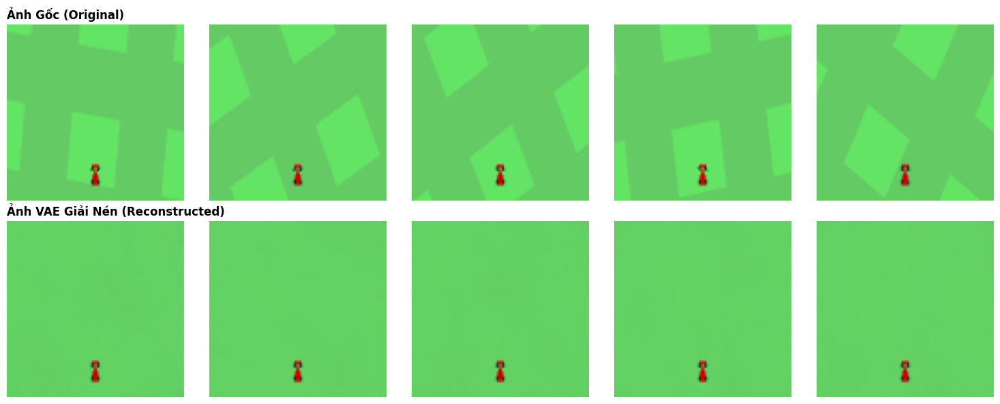

In [ ]:
## So sánh Ảnh Gốc và Ảnh Tái Tạo (Reconstruction)
import torch
import matplotlib.pyplot as plt

# ==========================================
# Hàm vẽ ảnh so sánh (Giữ nguyên của bạn vì quá đẹp)
# ==========================================
def plot_images(original, reconstructed, n=5):
    fig, axes = plt.subplots(2, n, figsize=(15, 6))

    for i in range(n):
        # Hiển thị ảnh gốc ở hàng trên
        axes[0, i].imshow(original[i].permute(1, 2, 0).cpu().numpy())
        axes[0, i].axis('off')

        # Hiển thị ảnh do VAE giải nén ở hàng dưới
        axes[1, i].imshow(reconstructed[i].permute(1, 2, 0).cpu().detach().numpy())
        axes[1, i].axis('off')

    axes[0, 0].set_title("Ảnh Gốc (Original)", fontsize=12, fontweight='bold', loc='left')
    axes[1, 0].set_title("Ảnh VAE Giải Nén (Reconstructed)", fontsize=12, fontweight='bold', loc='left')

    plt.tight_layout()
    plt.show()

# ==========================================
# Hàm test VAE (Đã fix lỗi Data và Chuẩn hóa)
# ==========================================
def test_vae(model, dataloader, n=5):
    device = next(model.parameters()).device
    model.eval() # Chuyển model sang chế độ evaluate (không cập nhật tạ)

    # 1. Lấy 1 batch dữ liệu từ dataloader
    ep_images, _, _, _ = next(iter(dataloader))

    # SỬA LỖI: Ép phẳng từ (batch, 1000, 3, 96, 96) thành ảnh rời (N, 3, 96, 96)
    images = ep_images.view(-1, 3, 96, 96)

    # SỬA LỖI: Chuẩn hóa pixel về [0, 1] y hệt lúc Train
    images = images.to(device).float() / 255.0

    with torch.no_grad():
        # Đưa ảnh qua model để lấy ảnh tái tạo
        reconstructed, _, _ = model(images)

    # Chọn ngẫu nhiên n ảnh từ batch để in ra
    indices = torch.randperm(images.size(0))[:n]
    plot_images(images[indices], reconstructed[indices], n)

# ==========================================
# Gọi hàm để xem kết quả
# ==========================================
print("Đang trích xuất 5 bức ảnh ngẫu nhiên từ không gian Latent Space...")
test_vae(model, dataloader, n=5)

### So sánh Ảnh Gốc và Ảnh Tái Tạo (Reconstruction)

## Trải nghiệm Tương tác Latent Space bằng Sliders

In [ ]:
import numpy as np
import torch
import matplotlib.pyplot as plt
from ipywidgets import FloatSlider, VBox, Button, Output, HBox, IntSlider
from IPython.display import display

LATENT_SIZE = 32
model.eval()
device = next(model.parameters()).device

def generate_image(latent_vector):
    with torch.no_grad():
        latent_tensor = torch.tensor(latent_vector, dtype=torch.float32).to(device).unsqueeze(0)
        generated_image = model.decode(latent_tensor).squeeze(0).cpu().numpy()
        return generated_image

# Khởi tạo sliders
num_sliders = 8
sliders = [FloatSlider(value=0.0, min=-3.0, max=3.0, step=0.1, description=f'Latent {i+1}') for i in range(num_sliders)]
output = Output()

def update_image(change):
    latent_vector = np.zeros(LATENT_SIZE)
    for i, slider in enumerate(sliders):
        latent_vector[i + shift_slider.value] = slider.value
    generated_image = generate_image(latent_vector)

    with output:
        output.clear_output(wait=True)
        plt.figure(figsize=(4, 4))
        plt.imshow(generated_image.transpose(1, 2, 0))
        plt.axis('off')
        plt.title('Ảnh sinh ra từ VAE Decoder', fontweight='bold')
        plt.show()

def update_slider_labels(shift_value):
    for i, slider in enumerate(sliders):
        slider.description = f'Latent {i + 1 + shift_value}'

for slider in sliders:
    slider.observe(update_image, 'value')

def generate_random_latent(button):
    latent_vector = np.random.uniform(-2.0, 2.0, size=LATENT_SIZE)
    for i, slider in enumerate(sliders):
        slider.value = latent_vector[i + shift_slider.value]
    update_image(None)

def reset_sliders(button):
    for slider in sliders:
        slider.value = 0.0
    update_image(None)

# Khởi tạo các nút bấm
random_button = Button(description='Random Vector', style={'button_color': '#3498db'})
random_button.on_click(generate_random_latent)

reset_button = Button(description='Reset Sliders', style={'button_color': '#e74c3c'})
reset_button.on_click(reset_sliders)

shift_slider = IntSlider(value=0, min=0, max=LATENT_SIZE - num_sliders, step=1, description='ĐỔI NHÓM:')
shift_slider.observe(lambda change: update_slider_labels(shift_slider.value), 'value')
shift_slider.observe(update_image, 'value')

# Layout hiển thị
slider_box = VBox(sliders + [shift_slider, HBox([random_button, reset_button])], layout={'margin': '10px'})
layout = HBox([output, slider_box])

display(layout)
update_slider_labels(shift_slider.value)
update_image(None)

## Trực quan hóa toàn bộ Không gian 32D bằng UMAP v2

In [ ]:
!pip install umap-learn > /dev/null 2>&1

Đang lấy mẫu dữ liệu...


Trích xuất Latent space:   0%|          | 2/1667 [00:01<24:20,  1.14it/s]
/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Đang chạy thuật toán UMAP cho 12000 điểm dữ liệu...


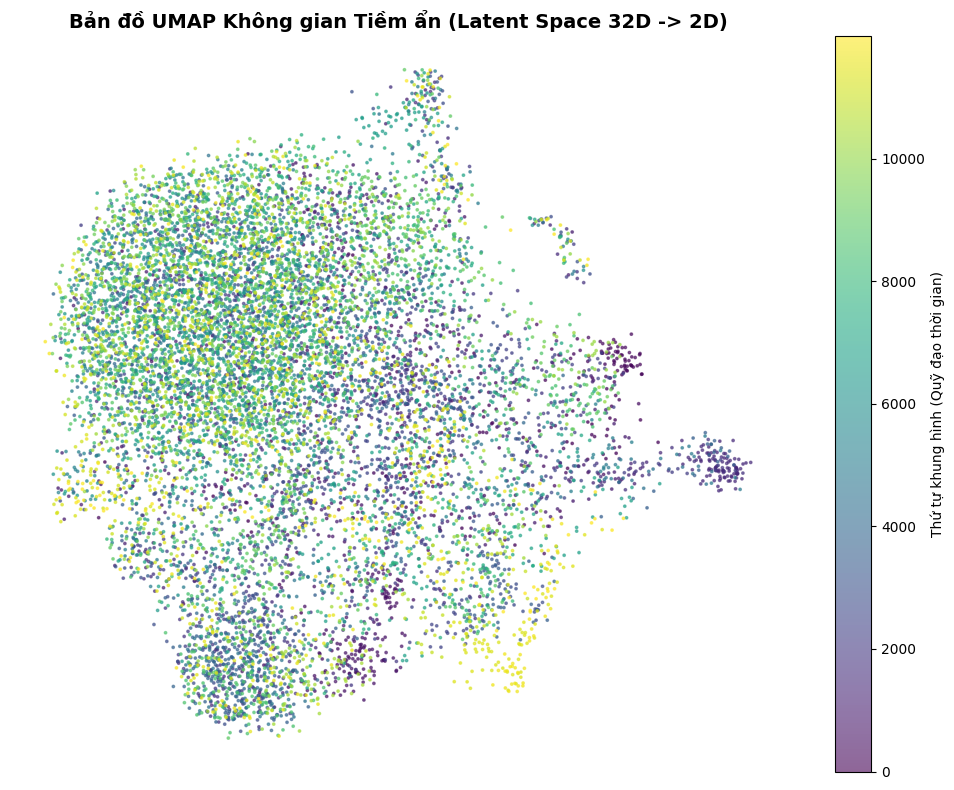

In [ ]:
import umap
from tqdm import tqdm
import matplotlib.pyplot as plt
import torch
import numpy as np

# ==========================================
# HÀM TRÍCH XUẤT LATENT SPACE (ĐÃ FIX LỖI)
# ==========================================
def get_latent_space(model, dataloader, max_batch):
    latent_space = []
    device = next(model.parameters()).device
    model.eval()

    with torch.no_grad():
        for i, (ep_images, _, _, _) in enumerate(tqdm(dataloader, desc='Trích xuất Latent space')):
            if i >= max_batch: break

            # SỬA LỖI 1: Ép phẳng nguyên ổ và Chuẩn hóa 255
            images = ep_images.view(-1, 3, 96, 96).to(device).float() / 255.0

            # Đưa vào VAE để lấy 32 con số
            mu, logvar = model.encode(images)
            z = model.reparameterize(mu, logvar)

            # Chuyển về CPU ngay lập tức để không bị tràn VRAM GPU
            latent_space.append(z.cpu())

    # Gộp tất cả các mẻ lại thành 1 ma trận khổng lồ
    latent_space = torch.cat(latent_space, dim=0)
    return latent_space.numpy()

# ==========================================
# THỰC THI
# ==========================================
print("Đang lấy mẫu dữ liệu...")
# SỬA LỖI 2: Chỉ lấy 2 mẻ (tương đương 12.000 bức ảnh) để UMAP không treo máy
latent_space = get_latent_space(model, dataloader, max_batch=2)

print(f"Đang chạy thuật toán UMAP cho {latent_space.shape[0]} điểm dữ liệu...")
umap_model = umap.UMAP(n_components=2, min_dist=0.5, random_state=42)
latent_2d_umap = umap_model.fit_transform(latent_space)

# SỬA LỖI 3: Tạo mảng màu dựa trên thứ tự khung hình để xem quỹ đạo
colors = np.arange(latent_space.shape[0])

# Vẽ đồ thị
plt.figure(figsize=(10, 8))
plt.scatter(latent_2d_umap[:, 0], latent_2d_umap[:, 1], c=colors, s=3, cmap='viridis', alpha=0.6)
plt.colorbar(label="Thứ tự khung hình (Quỹ đạo thời gian)")
plt.title("Bản đồ UMAP Không gian Tiềm ẩn (Latent Space 32D -> 2D)", fontsize=14, fontweight='bold')
plt.axis('off')
plt.tight_layout()
plt.show()

Đang vẽ bản đồ địa hình não bộ AI (KDE)...


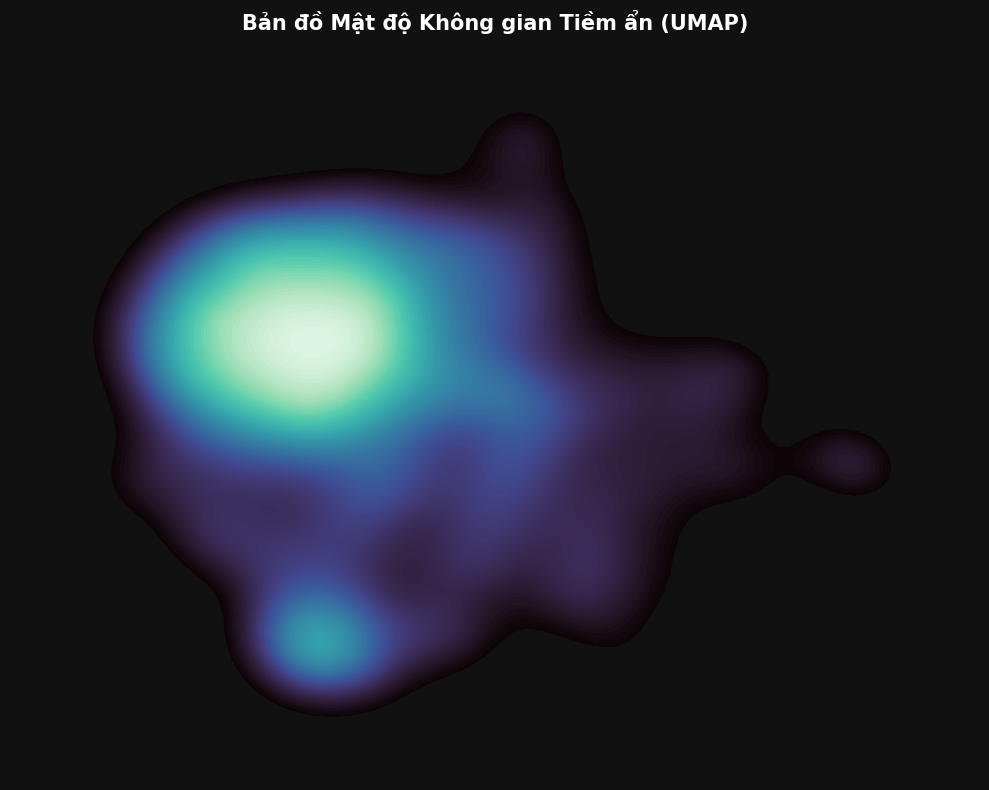

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_latent_space_density(latent_2d, method_name='UMAP'):
    # LƯU Ý: Hàm KDE chạy toán tích phân khá nặng.
    # Với 12.000 điểm, nó có thể load mất khoảng 10-20 giây, bạn cứ kiên nhẫn nhé!
    print("Đang vẽ bản đồ địa hình não bộ AI (KDE)...")

    fig, ax = plt.subplots(figsize=(10, 8))

    # "Độ" thêm cái nền đen huyền bí để tôn cái màu mako lên
    ax.set_facecolor('#111111')
    fig.patch.set_facecolor('#111111')

    # Sử dụng Kernel Density Estimate (KDE) của Seaborn
    sns.kdeplot(
        x=latent_2d[:, 0],
        y=latent_2d[:, 1],
        cmap="mako",      # Bảng màu đại dương sâu thẳm
        fill=True,        # Tô màu kín các vùng
        thresh=0.05,      # Cắt bỏ nhiễu
        levels=100,       # Độ mịn 100 dải màu cực mượt
        ax=ax
    )

    plt.title(f"Bản đồ Mật độ Không gian Tiềm ẩn ({method_name})", color='white', fontsize=15, fontweight='bold')
    plt.axis('off')
    plt.tight_layout()
    plt.show()

# Gọi hàm khai hỏa!
plot_latent_space_density(latent_2d_umap, 'UMAP')

### Trực quan hóa toàn bộ Không gian 32D bằng UMAP

In [ ]:
!pip install umap-learn > /dev/null 2>&1

Đang lấy mẫu dữ liệu...


Trích xuất Latent space:   4%|▍         | 20/500 [00:04<01:52,  4.26it/s]
/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Đang chạy thuật toán UMAP (Có thể mất vài chục giây)...


/tmp/ipykernel_1916/1851757449.py:32: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(latent_2d_umap[:, 0], latent_2d_umap[:, 1], s=3, cmap='viridis', alpha=0.6)


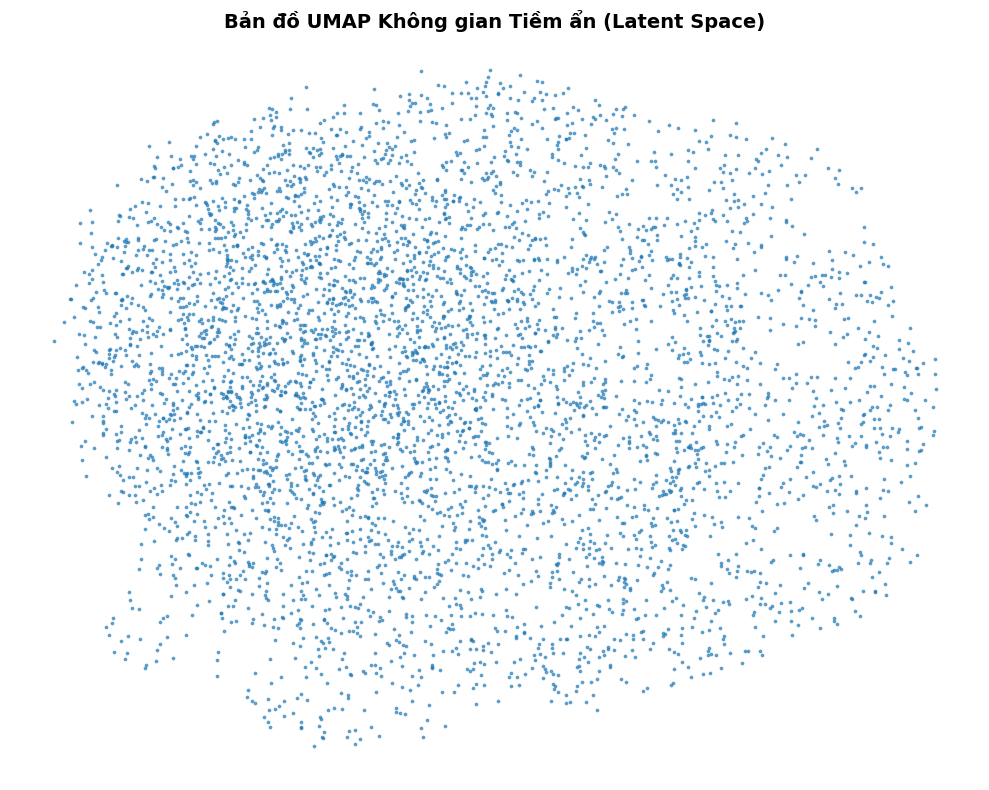

In [ ]:
import umap.umap_ as umap
from tqdm import tqdm
import matplotlib.pyplot as plt

def get_latent_space(model, dataloader, latent_size, max_batch):
    latent_space = []
    device = next(model.parameters()).device
    model.eval()

    with torch.no_grad():
        for i, (images, _, _, _) in enumerate(tqdm(dataloader, desc='Trích xuất Latent space')):
            if i >= max_batch: break
            mu, logvar = model.encode(images.to(device))
            z = model.reparameterize(mu, logvar)
            latent_space.append(z)

    # Gộp tất cả các batch lại
    latent_space = torch.cat(latent_space, dim=0)
    return latent_space.cpu().numpy()

# 1. Trích xuất khoảng vài ngàn điểm dữ liệu
print("Đang lấy mẫu dữ liệu...")
latent_space = get_latent_space(model, dataloader, LATENT_SIZE, max_batch=20)

# 2. Dùng UMAP để giảm chiều từ 32D xuống 2D
print("Đang chạy thuật toán UMAP (Có thể mất vài chục giây)...")
umap_model = umap.UMAP(n_components=2, min_dist=0.5, random_state=42)
latent_2d_umap = umap_model.fit_transform(latent_space)

# 3. Vẽ đồ thị
plt.figure(figsize=(10, 8))
plt.scatter(latent_2d_umap[:, 0], latent_2d_umap[:, 1], s=3, cmap='viridis', alpha=0.6)
plt.title("Bản đồ UMAP Không gian Tiềm ẩn (Latent Space)", fontsize=14, fontweight='bold')
plt.axis('off')
plt.tight_layout()
plt.show()

## create_enhanced_animation v2

In [ ]:
!apt-get install -y ffmpeg

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
ffmpeg is already the newest version (7:4.4.2-0ubuntu0.22.04.1).
0 upgraded, 0 newly installed, 0 to remove and 109 not upgraded.


In [ ]:
## Tạo Video Phân Tích Latent Space Nâng Cao (Enhanced Animation)
import os
import numpy as np
import torch
import matplotlib.pyplot as plt
from matplotlib import animation
from IPython.display import Video, display

def create_enhanced_animation(
    model,
    output_path,
    fps=30,
    resolution=(800, 600),
    latent_size=32,
    amplitude=5.0
):
    model.eval()
    device = next(model.parameters()).device

    # Setup khung hình với 3 khu vực: Ảnh VAE, Biểu đồ cột, và Text Info
    fig = plt.figure(figsize=(resolution[0]/100, resolution[1]/100), dpi=100)
    img_ax = plt.subplot2grid((4, 4), (0, 0), colspan=3, rowspan=3)
    viz_ax = plt.subplot2grid((4, 4), (0, 3), rowspan=3)
    info_ax = plt.subplot2grid((4, 4), (3, 0), colspan=4)
    info_ax.axis('off')

    print("🔍 Đang phân tích mức độ ảnh hưởng của 32 Dimensions...")
    dimension_impact = []
    base_latent = np.zeros(latent_size)

    with torch.no_grad():
        base_tensor = torch.tensor(base_latent, dtype=torch.float32).to(device).unsqueeze(0)
        base_image = model.decode(base_tensor).squeeze(0).cpu().numpy()

        # Test từng chiều một
        for dim in range(latent_size):
            test_latent = base_latent.copy()
            test_latent[dim] = amplitude

            test_tensor = torch.tensor(test_latent, dtype=torch.float32).to(device).unsqueeze(0)
            test_image = model.decode(test_tensor).squeeze(0).cpu().numpy()

            # Tính độ lệch MSE
            impact = np.mean((test_image - base_image) ** 2)
            dimension_impact.append((dim, impact))

    # Lấy top 10 chiều ảnh hưởng mạnh nhất
    dimension_impact.sort(key=lambda x: x[1], reverse=True)
    top_dimensions = [dim for dim, _ in dimension_impact[:10]]
    print(f"⭐ 10 Dimensions ảnh hưởng mạnh nhất: {top_dimensions}")

    # Lên kịch bản Video
    frames_per_segment = 60
    segments = [
        {"type": "sine_wave", "dimensions": top_dimensions[:3], "frames": frames_per_segment},
        {"type": "random_morph", "dimensions": top_dimensions, "frames": frames_per_segment},
        {"type": "circular", "dimensions": [top_dimensions[0], top_dimensions[1]], "frames": frames_per_segment},
        {"type": "wave", "dimensions": top_dimensions, "frames": frames_per_segment},
        {"type": "counterpoise", "dimensions": top_dimensions[:6], "frames": frames_per_segment}
    ]
    total_frames = sum(segment["frames"] for segment in segments)

    def generate_focused_random_vector():
        v = np.zeros(latent_size)
        for dim in top_dimensions:
            v[dim] = np.random.normal(0, amplitude/2)
        return v

    random_vectors = [generate_focused_random_vector() for _ in range(4)]
    random_vectors.append(random_vectors[0].copy())

    def update_dimension_viz(latent_vector, segment_title=None):
        viz_ax.clear()
        positions = np.arange(len(top_dimensions))
        values = [latent_vector[dim] for dim in top_dimensions]

        colors = []
        for val in values:
            intensity = min(1.0, abs(val) / amplitude)
            if val > 0: colors.append((1.0, 0.4 * (1-intensity), 0.4 * (1-intensity))) # Đỏ
            else: colors.append((0.4 * (1-intensity), 0.4 * (1-intensity), 1.0))       # Xanh

        viz_ax.barh(positions, values, color=colors)
        viz_ax.set_yticks(positions)
        viz_ax.set_yticklabels([f"D{dim}" for dim in top_dimensions])
        viz_ax.set_xlim(-amplitude, amplitude)
        viz_ax.axvline(x=0, color='gray', linestyle='-', alpha=0.3)
        viz_ax.set_title("Top Dimensions" if not segment_title else segment_title, fontsize=10)

    segment_start_frames = [0]
    for segment in segments:
        segment_start_frames.append(segment_start_frames[-1] + segment["frames"])

    def generate_frame(frame_num):
        segment_idx = 0
        while segment_idx < len(segments) and frame_num >= segment_start_frames[segment_idx + 1]:
            segment_idx += 1

        segment = segments[segment_idx]
        segment_frame = frame_num - segment_start_frames[segment_idx]
        segment_progress = segment_frame / segment["frames"]

        latent_vector = np.zeros(latent_size)
        segment_title = None

        if segment["type"] == "sine_wave":
            for i, dim in enumerate(segment["dimensions"]):
                phase = i * (2 * np.pi / len(segment["dimensions"]))
                latent_vector[dim] = amplitude * np.sin(segment_progress * 2 * np.pi + phase)
            segment_title = "Sóng Sin (Sine Wave)"

        elif segment["type"] == "random_morph":
            morph_idx = int(segment_progress * (len(random_vectors) - 1))
            morph_progress = segment_progress * (len(random_vectors) - 1) - morph_idx
            start_vector = random_vectors[morph_idx]
            end_vector = random_vectors[morph_idx + 1]
            latent_vector = start_vector + morph_progress * (end_vector - start_vector)
            segment_title = f"Nội suy ngẫu nhiên {morph_idx+1}/{len(random_vectors)-1}"

        elif segment["type"] == "circular":
            dim1, dim2 = segment["dimensions"][:2]
            latent_vector[dim1] = amplitude * np.cos(segment_progress * 2 * np.pi)
            latent_vector[dim2] = amplitude * np.sin(segment_progress * 2 * np.pi)
            segment_title = f"Xoay vòng D{dim1}-D{dim2}"

        elif segment["type"] == "wave":
            for i, dim in enumerate(segment["dimensions"]):
                phase = i * (4 * np.pi / len(segment["dimensions"]))
                latent_vector[dim] = amplitude * np.sin(segment_progress * 6 * np.pi + phase)
            segment_title = "Sóng lượn toàn dải"

        elif segment["type"] == "counterpoise":
            half = len(segment["dimensions"]) // 2
            for i, dim in enumerate(segment["dimensions"][:half]):
                latent_vector[dim] = amplitude * segment_progress
            for i, dim in enumerate(segment["dimensions"][half:]):
                latent_vector[dim] = amplitude * (1 - segment_progress)
            segment_title = "Cân bằng đối trọng"

        with torch.no_grad():
            latent_tensor = torch.tensor(latent_vector, dtype=torch.float32).to(device).unsqueeze(0)
            generated_image = model.decode(latent_tensor).squeeze(0).cpu().numpy()

        img_ax.clear()
        img_ax.imshow(generated_image.transpose(1, 2, 0))
        img_ax.axis('off')

        update_dimension_viz(latent_vector, segment_title)

        info_ax.clear()
        info_ax.axis('off')
        active_dims = [dim for dim in segment["dimensions"] if abs(latent_vector[dim]) > 0.1]

        description = f"{segment_title} - Frame {segment_frame+1}/{segment['frames']}\n"
        if active_dims:
            description += f"Đang kích hoạt: " + ", ".join([f"D{dim}:{latent_vector[dim]:.2f}" for dim in active_dims[:5]])
            if len(active_dims) > 5: description += f" và {len(active_dims)-5} biến khác..."

        info_ax.text(0.5, 0.5, description, ha='center', va='center', fontsize=10)
        fig.tight_layout()
        return [img_ax, viz_ax, info_ax]

    print(f"🎬 Đang render video {total_frames} frames (có thể mất 1-2 phút)...")
    anim = animation.FuncAnimation(fig, generate_frame, frames=total_frames, blit=False)

    writer = animation.FFMpegWriter(fps=fps, metadata=dict(artist='VAE Latent Space Explorer'), bitrate=5000)
    anim.save(output_path, writer=writer)
    plt.close()
    print(f"✅ Đã lưu video thành công tại: {output_path}")

# ==========================================
# GỌI HÀM VÀ PHÁT VIDEO TRÊN COLAB (ĐÃ FIX)
# ==========================================
# Tạo thư mục videos trên Drive nếu chưa có
video_folder = '/content/drive/MyDrive/WorldModels/videos'
os.makedirs(video_folder, exist_ok=True)
video_path = f'{video_folder}/latent_animation_enhanced.mp4'

print("Khởi động trình dựng phim FFMPEG...")

# Gọi hàm với ĐÚNG biến model của chúng ta
create_enhanced_animation(
    model=model,   # <-- FIX: Tên biến là model, không phải vision
    output_path=video_path,
    fps=30,
    resolution=(800, 600),
    amplitude=4.0  # Mức 4.0 là đủ biên độ để thấy rõ sự thay đổi mà không bị biến dạng quá đà
)

# Hiển thị video vừa render ngay trong Colab
display(Video(video_path, embed=True, html_attributes="controls loop autoplay width=800"))

Khởi động trình dựng phim FFMPEG...
🔍 Đang phân tích mức độ ảnh hưởng của 32 Dimensions...
⭐ 10 Dimensions ảnh hưởng mạnh nhất: [28, 20, 27, 16, 17, 1, 4, 31, 6, 29]
🎬 Đang render video 300 frames (có thể mất 1-2 phút)...
✅ Đã lưu video thành công tại: /content/drive/MyDrive/WorldModels/videos/latent_animation_enhanced.mp4
